# Assignment 1 - Part A and B:
In Part A you will learn how to code Belief Propogation. For Part B you have to compare different landcover classification approaches. How to load the data is discussed in this notebook.

**PLEASE USE `scikit-learn` FOR ALL MACHINE LEARNING RELATED TASKS**

**YOU ARE ALWAYS REQUIRED TO SUBMIT THE CODE THAT YOU DEVELOPED ALONGSIDE THE COMPLETED ANSWER NOTEBOOK**


**You will also be required to report on all the contents of this notebook once completed, the results sould be in your report and well documented**

### Group Name:
### Student Number(s):

This assignment is divided into two parts. You will first be required to implement belief propogation.
You will then be expected to build a sequential classifier which can discern between vegatation and settlement MODIS pixels. **PLEASE USE `scikit-learn` FOR ALL MACHINE LEARNING RELATED TASKS**

**YOU ARE ALWAYS REQUIRED TO SUBMIT THE CODE THAT YOU DEVELOPED ALONGSIDE THE COMPLETED ANSWER NOTEBOOK**

# Part A: Belief Propogation

Implement a BPSK (Binary Phase Shift Keying) modulation scheme on an AWGN (Additive White Gaussian Noise) communication channel.

Use this implementation to plot the simulated BER curve associated with an uncoded BPSK AWGN channel.

Also plot the theoretical BER curve for a uncoded BPSK channel.

Now add a Hamming (7,4,3) code to the channel and decode it using belief propogation.

Also plot the BER curve of the coded BPSK AWGN channel.


_Make sure that the curve is very smooth,otherwise marks will be deducted_

In [13]:
from IPython.display import Image
# Image("./uncoded_BPSK.jpg")

Your plot should look similar to:

In [14]:
# from IPython.display import Image
# Image("./ber.jpg")

In [15]:
"""Code Here"""





'Code Here'

# Part B Remote Sensing - MODIS

How to load the dataset you will be using for part B of the assignment is discussed below.

In [2]:
import json
import scipy.io
import pylab as plt
import numpy as np
from sklearn.mixture import GaussianMixture as GMM

from itertools import product
from matplotlib.colors import ListedColormap

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import os
import pandas as pd
import seaborn as sns
import math

## Load the data set

In this part of the assignment you will be required to train a time-varying MODIS classification model. You will then use the SPRT algorithm and the trained time-varying model to perform sequential classification of MODIS time-series. You will also implement a Naive Bayes classifier and a Logistic Regression classifier that takes as input the MODIS data after having performed dimensionality reduction on it. In the end you will compare the efficacy of the different classification algorithms with one another. Your main task is to discern between vegetation and settlement pixels. Below we plot a random MODIS vegetation and settlement pixel.

In [3]:
mat = scipy.io.loadmat("Gauteng_nochange.mat")
veg_gauteng = mat['veg_gauteng']
bwt_gauteng = mat['bwt_gauteng']
print(np.shape(veg_gauteng))

(368, 592, 8)


## Plotting a random vegetation and settlement MODIS pixel

dict_keys(['__header__', '__version__', '__globals__', 'bldg_gauteng', 'bwt_gauteng', 'veg_gauteng'])
(368, 592, 8)
(368, 333, 8)


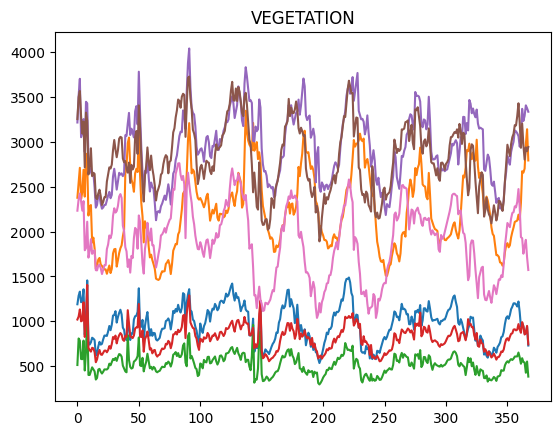

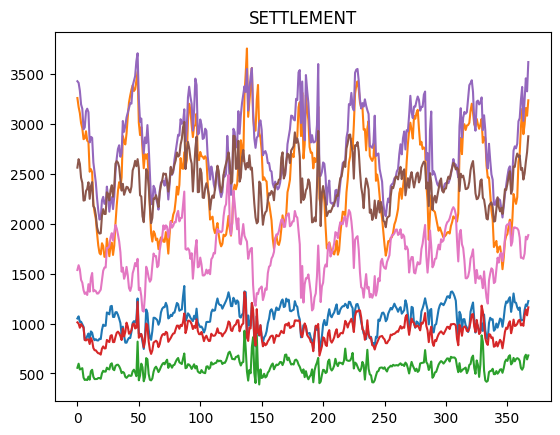

In [3]:
def plot_mat():
    print(mat.keys())
    print(veg_gauteng.shape)
    print(bwt_gauteng.shape)

    #PLOT A SINGLE VEGETATION MODIS PIXEL (over all time and bands - except NDVI)
    plt.plot(veg_gauteng[:,0,range(7)])
    plt.title("VEGETATION")
    plt.show()

    #PLOT A SINGLE SETTLEMENT MODIS PIXEL (over all time and bands - except NDVI)
    plt.plot(bwt_gauteng[:,0,range(7)])

    plt.title("SETTLEMENT")
    plt.show()

plot_mat()

We now load the data into a multi-dimensional numpy array.

**MISSING ANSWER**

Please plot the data recorded at time-step 7 of 45 in the first year. Your result should look similar to the graph depicted below.

In [13]:
# Image("/content/sample.png")

**`MISSING CODE`**

Let's create our observation matrix $\mathbf{X}$ -- [samples, features] and our class labels $\mathbf{y}$.

In [4]:
X = np.concatenate((veg_gauteng,bwt_gauteng),axis=1)
yv = np.ones(veg_gauteng.shape[1],dtype=int)
yb = np.zeros(bwt_gauteng.shape[1], dtype=int)
y = np.concatenate((yv, yb))

print(X.shape)
print(y.shape)

(368, 925, 8)
(925,)


Now that you have your data and you understand it it is time to complete Part B of the assignment. Please refer to the main assignment document for the details.

In [15]:
"""Code Here if you choose to answer Part B in the notebook"""

'Code Here if you choose to answer Part B in the notebook'

In [5]:
fs = 1/45
num_obs, num_pixels, num_bands = X.shape
scaler = MinMaxScaler()

def get_features():
    fft_results = np.fft.fft(X, axis=0)
    pixel_means = np.abs(fft_results[0])
    seasonal_amplitudes = 2 * np.abs(fft_results[int(num_obs * fs)])
    return np.array([scaler.fit_transform(pixel_means), scaler.fit_transform(seasonal_amplitudes)])

def plot_seasonal_amplitudes(ax, pixel_means, seasonal_amplitudes, split_length, title):
    ax.scatter(pixel_means[:split_length], seasonal_amplitudes[:split_length], label='Vegetation', color='r', edgecolor='k', s=20)
    ax.scatter(pixel_means[split_length:], seasonal_amplitudes[split_length:], label='Settlement', color='b', edgecolor='k', s=20)
    ax.set_xlabel(r"$f_{1}$")
    ax.set_ylabel(r"$f_{2}$")
    ax.legend()
    ax.set_title(title)

In [6]:
Y = get_features()
print(Y.shape)

(2, 925, 8)


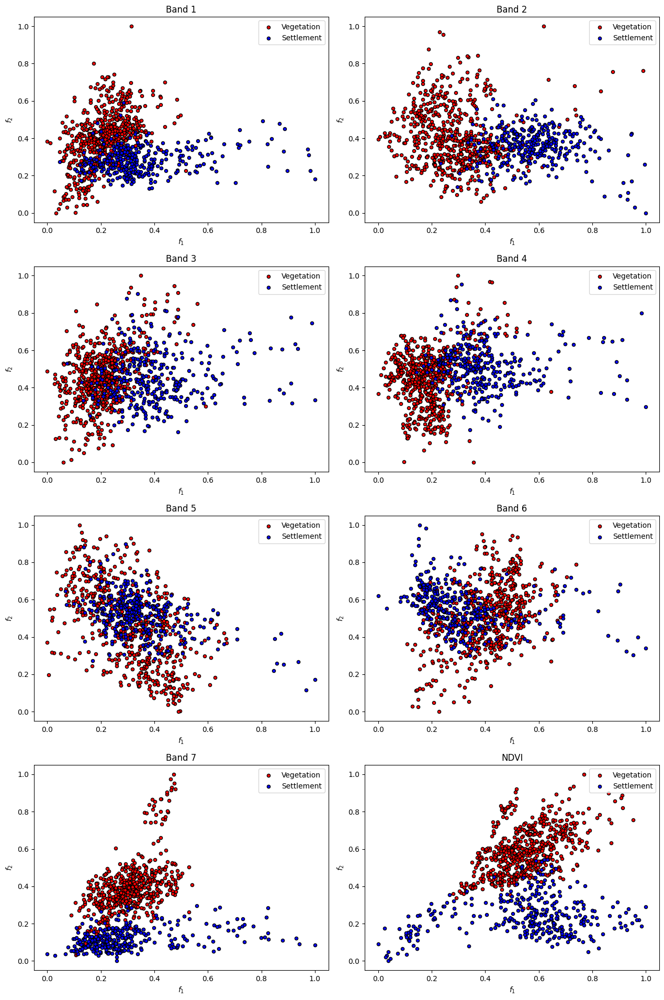

In [7]:
veg_length = veg_gauteng.shape[1]

bands = {i: f'Band {i+1}' for i in range(num_bands-1)}
bands[num_bands-1] = 'NDVI'

fig, axes = plt.subplots(4, 2, figsize=(2 * 6.4, 4 * 4.8))

for i, title in bands.items():
  plot_seasonal_amplitudes(axes[i // 2, int(i % 2 != 0)], Y[0, :, i], Y[1, :, i], veg_length, title)

fig.tight_layout()
plt.show()

In [8]:
SEED = 0
np.random.seed(SEED)

# Number of hyperparameters for experimental range
num_params = 1000
# x-axis ticks for train/val accuracy graphs
ticks = np.linspace(start=0, stop=num_params - 1, num=5, dtype=int)

# Colormaps
cmap_bold = np.array(['b', 'r'])
cmap_light = np.array(['#FFAAAA', '#AAAAFF'])
listed_cmap_light = ListedColormap(cmap_light[::-1])

# Reshape features to (pixels, features, bands)
Y = Y.transpose(1, 0, 2)

# Use a statified 50/50 train/test split
X_train, X_test, y_train, y_test = train_test_split(Y, y, test_size=0.5, stratify=y, random_state=SEED)

def plot_acc(results, param, best_index, best_score):
  x = list(range(num_params))
  labels = [results['params'][tick][param] for tick in ticks]

  fig, ax = plt.subplots(1, 1, figsize=(2 * 6.4, 4.8))

  ax.plot(x, results['mean_train_score'], label="Mean Train Acc")
  ax.plot(x, results['mean_test_score'], label="Mean Val Acc")
  ax.errorbar(x, results['mean_test_score'], yerr=results['std_test_score'], linestyle='', color='red', alpha=0.1, label="Val Acc ± Std Dev")
  ax.scatter(best_index, best_score, marker='o', edgecolor='k', color='red', label="Best Val Acc")
  ax.set_xlabel(param)
  ax.set_xticks(ticks=ticks, labels=labels)
  ax.set_ylabel("Accuracy")
  ax.set_title(f"Mean Accuracy for different {param}")
  ax.legend(loc='upper left')

  plt.tight_layout()
  plt.show()

def get_decision_boundaries(best_estimator):
  x_min, x_max = X_test[:, 0].min() - 1, X_test[:, 0].max() + 1
  y_min, y_max = X_test[:, 1].min() - 1, X_test[:, 1].max() + 1

  h = 0.001
  xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
  Z = best_estimator.predict(np.c_[xx.ravel(), yy.ravel()])

  return xx, yy, Z.reshape(xx.shape)


def get_acc_and_plot_results(best_estimator, X_test, y_true, train_or_test):
  y_pred = best_estimator.predict(X_test)

  fig, axes = plt.subplots(1, 2, figsize=(2 * 6.4, 4.8))

  xx, yy, Z = get_decision_boundaries(best_estimator)
  axes[0].pcolormesh(xx, yy, Z, cmap=listed_cmap_light)
  axes[0].scatter(X_test[:, 0], X_test[:, 1], c=cmap_bold[y_pred], edgecolor='k', s=20)
  axes[0].set_xlabel(r"$f_{1}$")
  axes[0].set_ylabel(r"$f_{2}$")
  axes[0].set_title("Decision Boundaries")
  axes[0].axis('tight')
  axes[0].set_xlim([-0.1, 1.1])
  axes[0].set_ylim([-0.1, 1.1])

  cm = confusion_matrix(y_true, y_pred, normalize='true')
  accuracy = cm.diagonal().mean()
  ConfusionMatrixDisplay(confusion_matrix=cm).plot(cmap=plt.cm.Blues, ax=axes[1])
  axes[1].set_title("Confusion Matrix")

  fig.suptitle(f"{train_or_test} Accuracy: {accuracy}", fontsize=16)

  plt.tight_layout()
  fig.subplots_adjust(top=0.88)
  plt.show()

  return accuracy

def tune_param(param, experimental_range, clf_instance, clf_args):
  grid = {
    param: experimental_range
  }

  acc = np.zeros(num_bands, dtype=float)

  for i, band in bands.items():
    print(f"{band} RESULTS:")
    clf = clf_instance(**clf_args)

    X_train_i = X_train[:, :, i]
    X_test_i = X_test[:, :, i]

    search = GridSearchCV(clf, grid, scoring='accuracy', cv=kf, n_jobs=-1, return_train_score=True)
    results = search.fit(X_train_i, y_train)

    best_estimator = results.best_estimator_
    best_score = results.best_score_
    best_params = results.best_params_
    best_index = results.best_index_

    # Summarize the best results
    print("Best Estimator:", best_estimator)
    print("Best Score:", best_score)
    print("Best Parameters:", best_params)
    print("Best Index:", best_index)

    results = results.cv_results_

    # Plot train / val accuracy for different hyperparameter values
    plot_acc(results, param, best_index, best_score)

    # Training results
    get_acc_and_plot_results(best_estimator, X_train_i, y_train, "Train")

    # Testing results
    acc[i] = get_acc_and_plot_results(best_estimator, X_test_i, y_test, "Test")

    print()

  return acc.tolist()

# Plot train/test splits per band

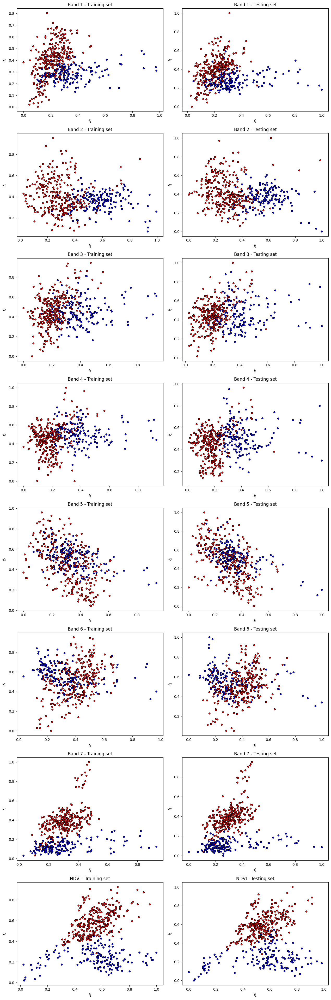

In [9]:
fig, axes = plt.subplots(len(bands), 2, figsize=(2 * 6.4, len(bands) * 4.8))

# Iterate through bands
for i, title in bands.items():
    # Plot for training set
    axes[i, 0].scatter(X_train[:, 0, i], X_train[:, 1, i], c=cmap_bold[y_train], edgecolor='k', s=20)
    axes[i, 0].set_xlabel(r"$f_{1}$")
    axes[i, 0].set_ylabel(r"$f_{2}$")
    axes[i, 0].set_title(f"{title} - Training set")

    # Plot for testing set
    axes[i, 1].scatter(X_test[:, 0, i], X_test[:, 1, i], c=cmap_bold[y_test], edgecolor='k', s=20)
    axes[i, 1].set_xlabel(r"$f_{1}$")
    axes[i, 1].set_ylabel(r"$f_{2}$")
    axes[i, 1].set_title(f"{title} - Testing set")

# Adjust layout and display
fig.tight_layout()
plt.show()

# Plot K-fold train/val splits per band

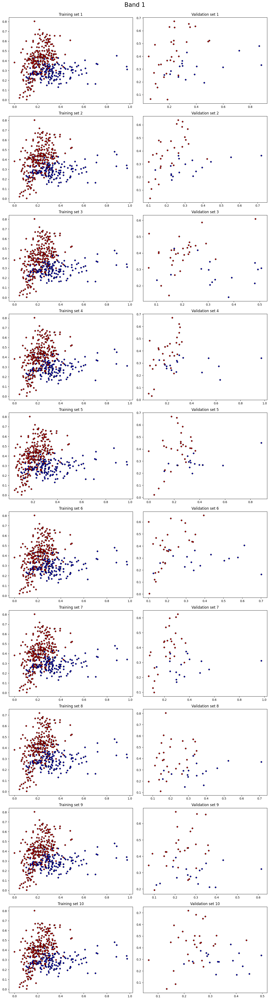

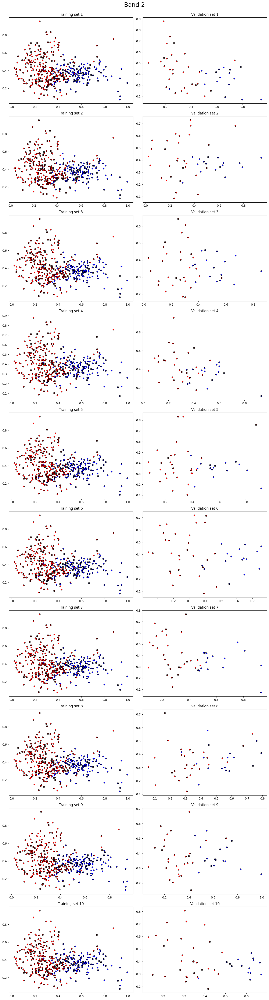

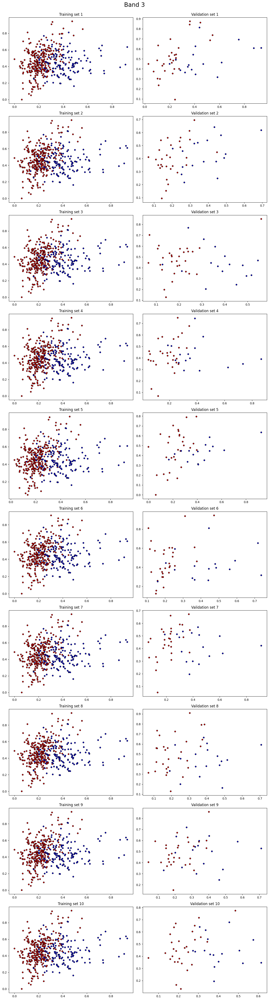

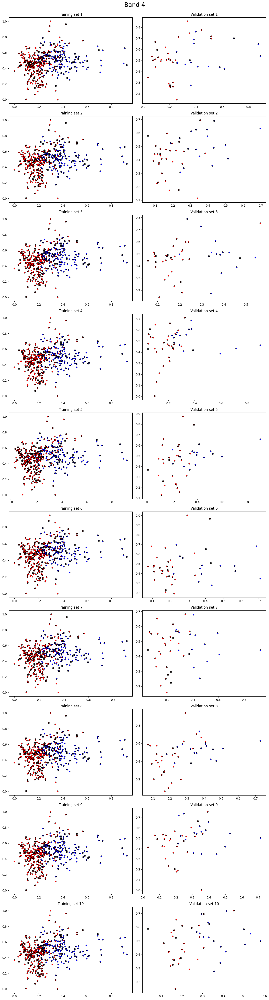

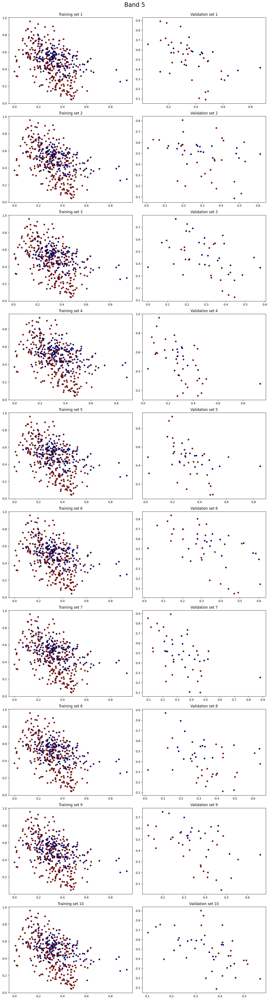

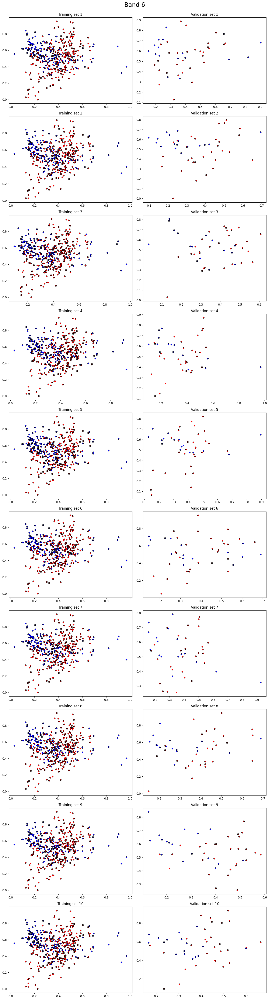

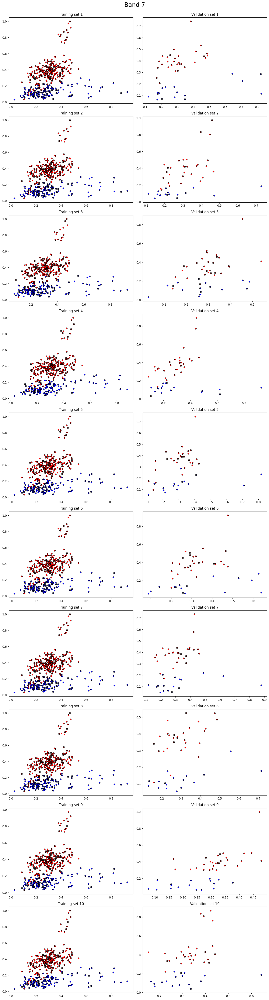

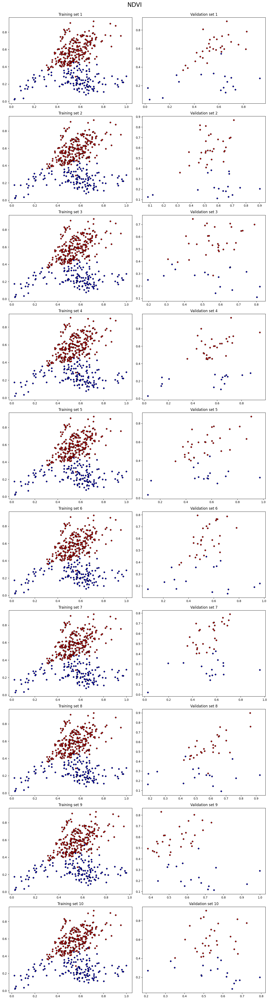

In [10]:
# Define the number of folds
num_folds = 10
kf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=SEED)

for i, title in bands.items():
  fig, axes = plt.subplots(num_folds, 2, figsize=(2 * 6.4, num_folds * 4.8))

  fig.suptitle(title, fontsize=20)
  for j, (train_index, val_index) in enumerate(kf.split(X_train, y_train)):
      X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
      y_train_fold, y_val_fold = y_train[train_index], y_train[val_index]

      # Plot training set
      axes[j, 0].scatter(X_train_fold[:, 0, i], X_train_fold[:, 1, i], c=cmap_bold[y_train_fold], edgecolor='k', s=20)
      axes[j, 0].set_title(f"Training set {j+1}")

      # Plot validation set
      axes[j, 1].scatter(X_val_fold[:, 0, i], X_val_fold[:, 1, i], c=cmap_bold[y_val_fold], edgecolor='k', s=20)
      axes[j, 1].set_title(f"Validation set {j+1}")

  fig.tight_layout()
  fig.subplots_adjust(top=0.965)
  plt.show()

# Classifiers

In [5]:
classifier_accuracies = dict()

## Logistic Regression

In [ ]:
classifier_accuracies['LR lbfgs'] = tune_param("C", np.logspace(-1, 3, num_params), LogisticRegression, dict(solver='lbfgs'))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
classifier_accuracies['LR newton-cholesky'] = tune_param("C", np.logspace(-1, 3, num_params), LogisticRegression, dict(solver='newton-cholesky'))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
classifier_accuracies['LR liblinear'] = tune_param("C", np.logspace(-1, 3, num_params), LogisticRegression, dict(solver='liblinear', random_state=SEED))

Output hidden; open in https://colab.research.google.com to view.

## Naive Bayes

In [ ]:
classifier_accuracies['NB'] = tune_param("var_smoothing", np.logspace(0, -3, num_params), GaussianNB, dict())

Output hidden; open in https://colab.research.google.com to view.

## Time-Varying Sequential Model and SPRT Test

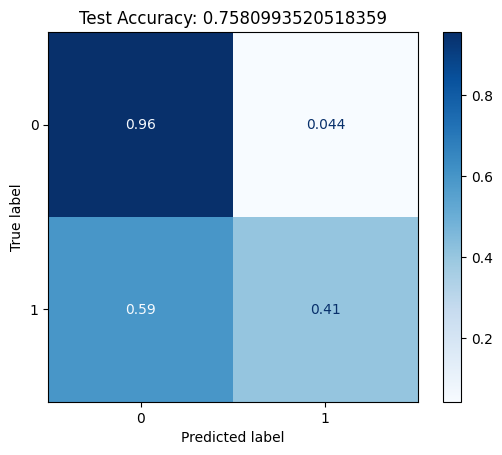

12.5%


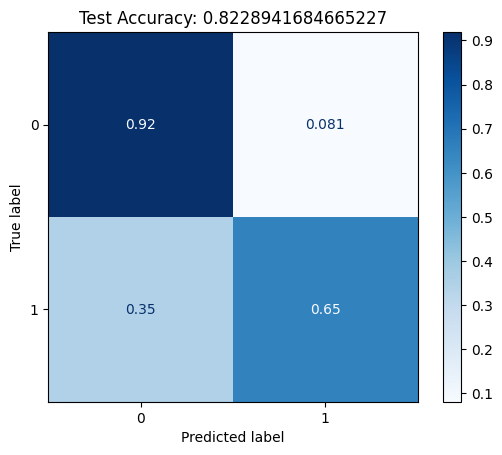

25.0%


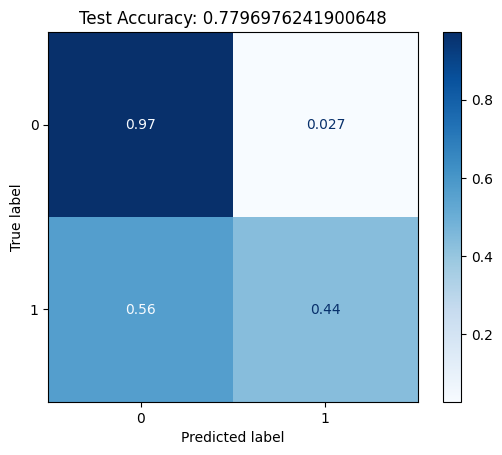

37.5%


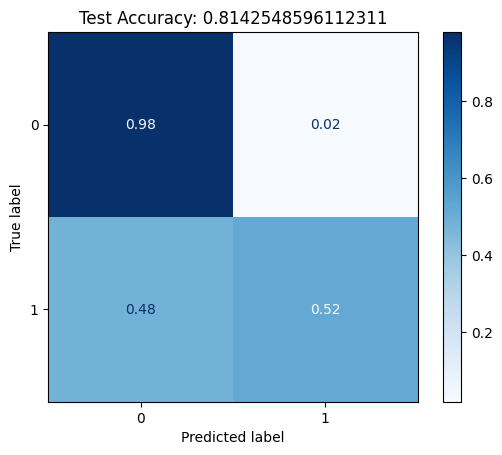

50.0%


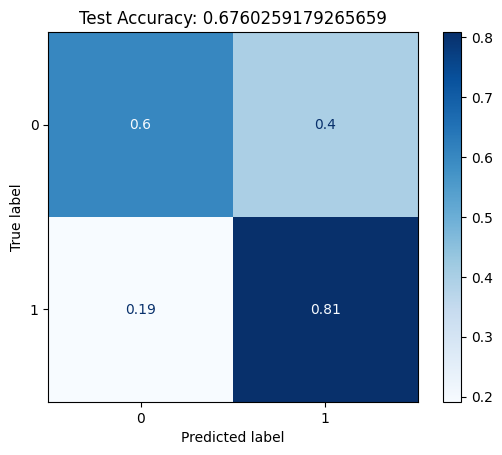

62.5%


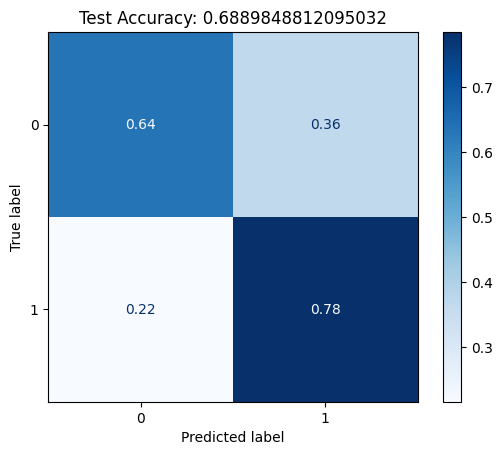

75.0%


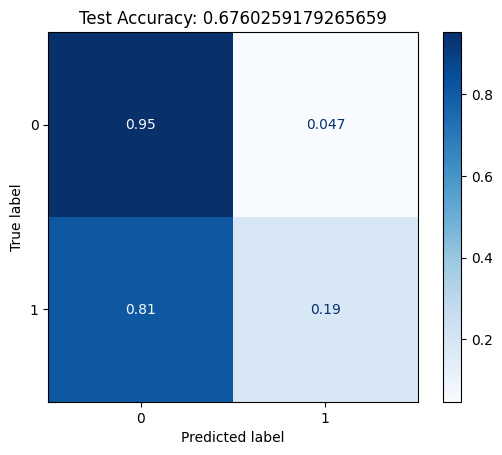

87.5%


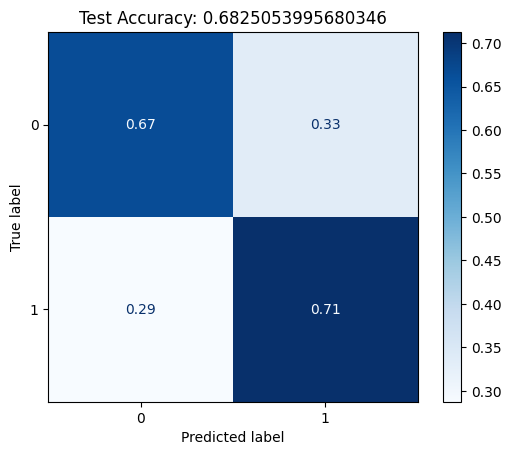

100.0%
[0.7580993520518359, 0.8228941684665227, 0.7796976241900648, 0.8142548596112311, 0.6760259179265659, 0.6889848812095032, 0.6760259179265659, 0.6825053995680346]


In [29]:
class seq:
    def __init__(self, period):
        self.period = period
        self.veg = []
        self.q_veg = []
        self.bwt = []
        self.q_bwt = []

    def fit(self, X_veg, X_bwt):
        for k in range(0, self.period):
            period_data = []
            I, p, c = np.shape(X_veg)
            for x in range(0, I):
                for y in range(0, p):
                    if X_veg[x, y, -1]==k:
                        period_data.append(X_veg[x, y, :-1])
            period_data = np.array(period_data)
            self.veg.append(period_data)

            period_data = []
            I, p, c = np.shape(X_bwt)
            for x in range(0, I):
                for y in range(0, p):
                    if X_bwt[x, y, -1]==k:
                        period_data.append(X_bwt[x, y, :-1])
            period_data = np.array(period_data)
            self.bwt.append(period_data)

    def predict_seq(self, X, band, pi_prior):
        self.train(band)
        I, p = np.shape(X)
        preds = []
        for i in range(0, p):
            pi = pi_prior
            for j in range(0, I):
                num = pi*math.exp(self.q_bwt[j%self.period].score(X[j, i].reshape(-1, 1)))
                den = num+(1-pi)*math.exp(self.q_veg[j%self.period].score(X[j, i].reshape(-1, 1)))
                pi = num/den
            if pi > 0.5:
                preds.append(1)
            else:
                preds.append(0)
        return preds
    
    def predict_SPRT(self, X, band, alpha, beta):
        a = math.log(beta/(1-alpha))
        h = math.log((1-beta)/alpha)
        self.train(band)
        I, p = np.shape(X)
        preds = []
        for i in range(0, p):
            sum = 0
            for j in range(0, I):
                sum += math.log(math.exp(self.q_bwt[j%self.period].score(X[j, i].reshape(-1, 1)))/math.exp(self.q_veg[j%self.period].score(X[j, i].reshape(-1, 1))))
                if sum <= a:
                    preds.append(0)
                    break
                if sum >= h:
                    preds.append(1)
                    break
        return preds

    def train(self, band):
        self.q_veg = []
        self.q_bwt = []
        for k in range(0, self.period):
            data = self.veg[k][:, band].reshape(-1, 1)
            self.q_veg.append(GMM().fit(data))
            data = self.bwt[k][:, band].reshape(-1, 1)
            self.q_bwt.append(GMM().fit(data))

SEED = 0
np.random.seed(SEED)

period = 45

I, p_veg, b = np.shape(veg_gauteng)

l = []
s = np.indices((I, p_veg, b))[0]
for x in range(0, I):
    for y in range(0, p_veg):
        l.append(s[x, y, 0]%period)
l = np.array(l)
l = l.reshape(I, p_veg, 1)
newVeg = np.concatenate((veg_gauteng, l), axis=2)

I, p_bwt, b = np.shape(bwt_gauteng)

l = []
s = np.indices((I, p_bwt, b))[0]
for x in range(0, I):
    for y in range(0, p_bwt):
        l.append(s[x, y, 0]%period)
l = np.array(l)
l = l.reshape(I, p_bwt, 1)
newBwt = np.concatenate((bwt_gauteng, l), axis=2)

mask = np.zeros(p_veg, dtype=bool)
mask[np.random.choice(p_veg, size=p_veg//2, replace=False)] = True
X_train = newVeg[:, mask, :]
Veg_test = newVeg[:, ~mask, :]
newVeg = X_train

mask = np.zeros(p_bwt, dtype=bool)
mask[np.random.choice(p_bwt, size=p_bwt//2, replace=False)] = True
X_train = newBwt[:, mask, :]
Bwt_test = newBwt[:, ~mask, :]
newBwt = X_train

X_test = np.concatenate((Veg_test, Bwt_test), axis=1)
Y_test = np.repeat(0, p_veg-(p_veg//2))
Y_test = np.append(Y_test, np.repeat(1, p_bwt-(p_bwt//2)))

s = seq(period)
s.fit(newVeg, newBwt)
p = p_bwt/(p_veg+p_bwt)

seq_accuracies = []
SPRT_accuracies = []
for i in range(0, b):
    preds = s.predict_SPRT(X_test[:, :, i], i, 0.05, 0.05)
    SPRT_accuracies.append(1-sum(abs(preds-Y_test))/len(Y_test))
    # preds = s.predict_seq(X_test[:, :, i], i, p)
    # seq_accuracies.append(1-sum(abs(preds-Y_test))/len(Y_test))
    ConfusionMatrixDisplay(confusion_matrix(Y_test, preds, normalize='true')).plot(cmap=plt.cm.Blues)
    plt.title('Test Accuracy: '+str(1-sum(abs(preds-Y_test))/len(Y_test)))
    plt.show()
    print(str((i+1)*100/8)+'%')
#classifier_accuracies['time varying'] = seq_accuracies
#classifier_accuracies['SPRT'] = SPRT_accuracies
print(SPRT_accuracies)


## Save accuracies for current SEED to JSON file

In [ ]:
with open(f"accuracies_{SEED}.json", "w") as file:
    json.dump(classifier_accuracies, file, indent=4)

## Plot the classification accuracies of each classifier and band in a bar graph

In [ ]:
def plot_classification_accuracies(classifier_accuracies):
    num_classifiers = len(classifier_accuracies)

    fig, ax = plt.subplots(figsize=(12, 6))

    bar_width = 0.2
    index = np.arange(num_bands)

    for i, (classifier, accuracies) in enumerate(classifier_accuracies.items()):
        bar_positions = index + i * bar_width
        ax.bar(bar_positions, accuracies, bar_width, label=classifier)

    ax.set_xlabel('Bands')
    ax.set_ylabel('Accuracy')
    ax.set_title('Classification Accuracies by Band and Classifier')
    ax.set_xticks(index + bar_width * (num_classifiers - 1) / 2)
    ax.set_xticklabels(bands.values())
    ax.legend(title="Classifier", bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

plot_classification_accuracies(classifier_accuracies)

# Plot the average classifier accuracies per band and stadard deviations for multiple runs with different random seeds

In [76]:
def process_accuracy_data(directory):
  data = {}

  for filename in os.listdir(directory):
      if filename.endswith(".json") and filename.startswith("accuracies_"):
          with open(os.path.join(directory, filename), 'r') as file:
              content = json.load(file)
              for classifier, accuracies in content.items():
                  if classifier not in data:
                      data[classifier] = {'accuracies': []}
                  data[classifier]['accuracies'].append(accuracies)

  summary_data = {}
  for classifier, info in data.items():
      accuracies_matrix = np.array(info['accuracies'])
      avg_accuracies = np.mean(accuracies_matrix, axis=0)
      std_accuracies = np.std(accuracies_matrix, axis=0)
      summary_data[classifier] = {'avg_accuracies': avg_accuracies, 'std_accuracies': std_accuracies}

  df = pd.DataFrame.from_dict(summary_data, orient='index')
  df['bands'] = np.repeat(bands.values(), 6)
  df = df.explode(['bands', 'avg_accuracies', 'std_accuracies'])
  df.reset_index(inplace = True)
  df.rename(columns = {'index':'classifier', 'bands':'band', 'avg_accuracies':'mean_accuracy', 'std_accuracies':'std_accuracy'}, inplace = True)

  return df

def plot_avg_classification_accuracies(df):
    plt.figure(figsize=(12, 6))

    ax = sns.barplot(x='band', y='mean_accuracy', hue='classifier', data=df)
    num_classifiers = df['classifier'].nunique()

    for i, band in bands.items():
        for j, classifier in enumerate(df['classifier'].unique()):
            mean_accuracy = df[(df['band'] == band) & (df['classifier'] == classifier)]['mean_accuracy'].iloc[0]
            std_accuracy = df[(df['band'] == band) & (df['classifier'] == classifier)]['std_accuracy'].iloc[0]

            x_position = i + (j - (num_classifiers - 1) / 2) * 0.14
            ax.errorbar(x=x_position, y=mean_accuracy, yerr=std_accuracy, fmt='none', color='black', capthick=1, capsize=3)

    ax.set(title='Average Classification Accuracies per band ± Std Dev',
           xlabel='Band',
           ylabel='Average Accuracy')
    ax.legend(title="Classifier", bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

C:\Users\Dell G3 3590\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Dell G3 3590\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Dell G3 3590\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtyp

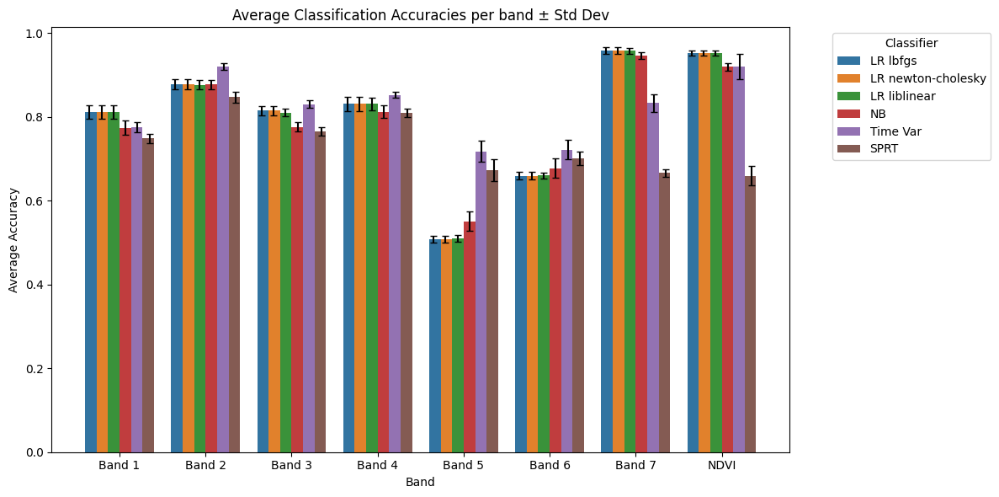

In [77]:
#directory = '/content'
directory = './'
df = process_accuracy_data(directory)
plot_avg_classification_accuracies(df)